In [1]:
import numpy as np
import math
from fractions import Fraction
import itertools
from biotuner_utils import *
from biotuner_offline import *
from biotuner import *
from biotuner_object import *
from biotuner2d import *
import matplotlib.pyplot as plt
from numpy import array, zeros, ones, arange, log2, sqrt, diff, concatenate
import emd
from PyEMD import EMD, EEMD
from scipy.signal import butter, lfilter
import colorednoise as cn
import pytuning.visualizations.scales
from pytuning.visualizations.scales import consonance_matrix

import mne
import os
import time
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)
from dictionaries import *

pygame 2.0.1 (SDL 2.0.14, Python 3.7.4)
Hello from the pygame community. https://www.pygame.org/contribute.html


#### This notebook is intended to demonstrate the use of the biotuner (https://github.com/antoineBellemare/biotuner/)
#### The general idea is extract harmonic information from biological time series to inform the computation of musical structures
#### The terms ''tuning'' and ''scale'' will be used interchangeably, referring to a series of ratios that subdivide an octave

## Load dataset

In [2]:

#path = 'D:/Science/EEG_data/'
path = 'C:/Users/Dell/GitHub/CoCoBrainChannel/'
epochs = mne.read_epochs(path+'pareidolia_run2.fif')
epochs = epochs.apply_baseline((-1.5, -0.1))
#epochs = epochs.crop(0.5, 7.5)
epochs_data = epochs.get_data()

Reading C:/Users/Dell/GitHub/CoCoBrainChannel/pareidolia_run2.fif ...


<ipython-input-2-4c36a6ad8073>:3: RuntimeWarning: This filename (C:/Users/Dell/GitHub/CoCoBrainChannel/pareidolia_run2.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(path+'pareidolia_run2.fif')


    Found the data of interest:
        t =   -1500.00 ...    8000.00 ms
        0 CTF compensation matrices available
104 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Applying baseline correction (mode: mean)


## peaks_extraction and peaks_extension methods

There is no minimum size for time series. However, time series shorter than 1 second will not allow for peak extraction below 2Hz.

Peaks functions:

'fixed' : ranges of frequency bands are fixed

'adapt' : ranges of frequency bands are defined based on the alpha peak

'EMD': Intrinsic Mode Functions (IMFs) are derived from Empirical Mode Decomposition (EMD)  
                   FFT is computed on each IMF
                   
'EEMD': Intrinsic Mode Functions (IMFs) are derived from Ensemble Empirical Mode Decomposition (EMD)  
                    FFT is computed on each IMF
                    
'HH1D_max': maximum values of the 1d Hilbert-Huang transform on each IMF using EEMD.

'harmonic_peaks': keeps peaks for which a maximum of other peaks are harmonics

'cepstrum': peak frequencies of the cepstrum (inverse Fourier transform (IFT) of the logarithm of the estimated signal spectrum)

'FOOOF' : peaks rising above the aperiodic component

In [3]:

start = time.time()
FREQ_BANDS = [[1, 3], [3, 7], [7, 12], [12, 18], [18, 30], [30, 45]] # Define frequency bands for peaks_function = 'fixed'
data = epochs_data[7][39][3000:5000] # Define data (single time series)


biotuning = biotuner(sf = 1000, peaks_function = 'EEMD', precision = 0.1, n_harm = 10,
                    ratios_n_harms = 5, ratios_inc_fit = True, ratios_inc = True) # Initialize biotuner object

biotuning.peaks_extraction(data, FREQ_BANDS = FREQ_BANDS, ratios_extension = True, max_freq = 50)
biotuning.compute_peaks_metrics()

stop = time.time()
print(stop-start)

0.07003974914550781


C:\Users\Dell\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1966: UserWarning: nperseg = 10000 is greater than input length  = 2000, using nperseg = 2000
  .format(nperseg, input_length))
C:\Users\Dell\GitHub\biotuner\biotuner.py:168: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  harm_fit = np.array(harm_temp).squeeze()


## Dissonance curve

The dissonance curve needs as input a list of peaks and a list of associated amplitudes. Since providing less than 6 spectral peaks would lead to less interesting dissonance curve, the method ''peaks_extension'' provides a way to extend the number of peaks based on the harmonic_fit function (see biotuner.py)

peaks_extension methods: 
['harmonic_fit', 'consonant', 'multi_consonant', 'consonant_harmonic_fit', 'multi_consonant_harmonic_fit']

[1200, 1270, 1390, 1500, 1520, 1580, 1690, 1900, 1920, 1940, 2000]


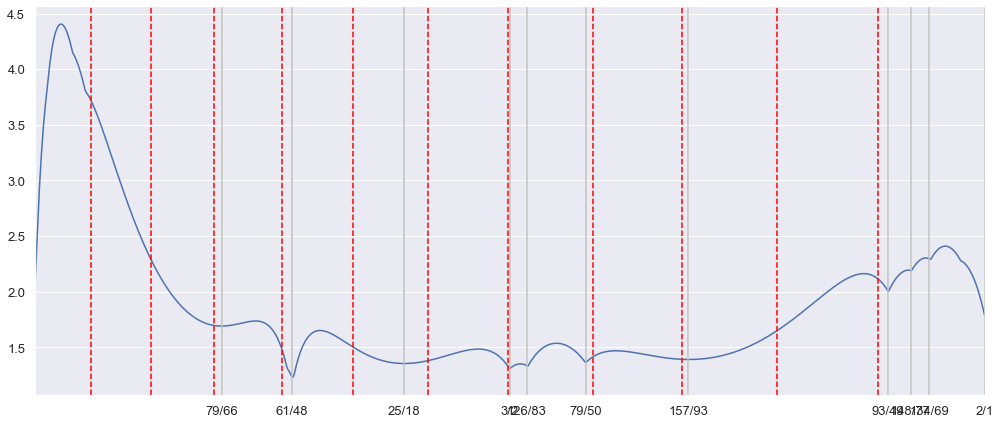

intervals [(79, 66), (61, 48), (25, 18), (3, 2), (126, 83), (79, 50), (157, 93), (93, 49), (148, 77), (134, 69), (2, 1)]


In [4]:
biotuning.peaks_extension(method = 'consonant_harmonic_fit', harm_function = 'mult',  n_harm = 10, cons_limit = 0.1, 
                          ratios_extension = True, scale_cons_limit = 0.1)
biotuning.compute_diss_curve(plot = True, input_type = 'extended_peaks', euler_comp = False, denom = 100, max_ratio = 2, n_tet_grid = 12)


In [5]:
print('Dissonance curve metrics:', biotuning.scale_metrics)
print('Dissonance curve tuning:', biotuning.diss_scale)
print('Dissonance curve consonant tuning:', biotuning.diss_scale_cons)

Dissonance curve metrics: {'diss_euler': 'NaN', 'dissonance': 1.8784142796861867, 'diss_harm_sim': 9.662956812455283, 'diss_n_steps': 11}
Dissonance curve tuning: [1.196969696969697, 1.2708333333333333, 1.3888888888888888, 1.5, 1.5180722891566265, 1.58, 1.6881720430107527, 1.8979591836734695, 1.922077922077922, 1.9420289855072463, 2.0]
Dissonance curve consonant tuning: [1.5 2. ]


In [6]:
### If you want the tuning in fraction
scale_frac, num, denom = scale2frac (biotuning.diss_scale, maxdenom = 1000)
scale_frac

[79/66, 61/48, 25/18, 3/2, 126/83, 79/50, 157/93, 93/49, 148/77, 134/69, 2]

## Harmonic entropy

Harmonic entropy takes as input a list of ratios.

If input_type = 'peaks' or 'extended_peaks', their ratios will be used.
Other input types use extended ratios : see biotuner ref.

'extended_ratios_inc'  (increments of the ratios in the form of 'r^1, r^2, r^3, ... r^n)

'extended_ratios_inc_fit' (harmonic fit between the ratios increments)

'extended_ratios_harm'


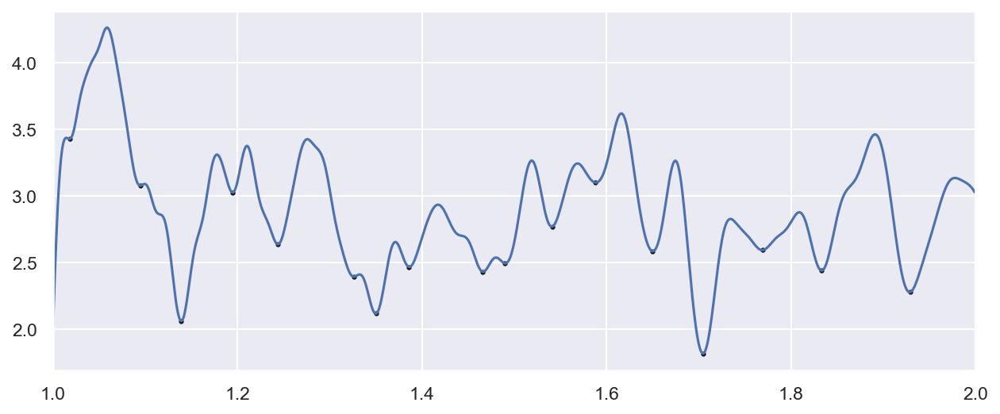

In [7]:
biotuning.peaks_extension(method = 'consonant_harmonic_fit', harm_function = 'mult',  n_harm = 20, 
                          cons_limit = 0.1, ratios_extension = True)
biotuning.compute_harmonic_entropy(input_type = 'extended_ratios_inc', plot_entropy = True, octave = 2, rebound = False, 
                                   scale_cons_limit = 0.01, sub=False)

In [8]:
print('Harmonic entropy metrics:', biotuning.scale_metrics)
print('Harmonic entropy tuning:', biotuning.HE_scale)
print('Harmonic entropy consonant tuning:', biotuning.HE_scale_cons)

Harmonic entropy metrics: {'diss_euler': 'NaN', 'dissonance': 1.8784142796861867, 'diss_harm_sim': 9.662956812455283, 'diss_n_steps': 11, 'HE': 2.9016376899520426, 'HE_n_steps': 17, 'HE_harm_sim': 1.4316106432983078}
Harmonic entropy tuning: [1.018 1.095 1.139 1.195 1.244 1.326 1.35  1.386 1.466 1.49  1.541 1.588
 1.65  1.705 1.769 1.833 1.929]
Harmonic entropy consonant tuning: [1.35 1.49 1.65]


In [9]:
### If you want the tuning in fraction
scale_frac, num, denom = scale2frac (biotuning.HE_scale, maxdenom = 100)
scale_frac

[57/56,
 23/21,
 41/36,
 49/41,
 51/41,
 61/46,
 27/20,
 79/57,
 129/88,
 149/100,
 94/61,
 27/17,
 33/20,
 104/61,
 23/13,
 11/6,
 191/99]

##  Deriving tunings from peaks ratios

In [10]:
biotuning.peaks_ratios  #peaks ratios

[1.0789473684210527,
 1.1341463414634148,
 1.1451612903225805,
 1.223684210526316,
 1.2567567567567568,
 1.2987804878048783,
 1.4013157894736843,
 1.4391891891891893,
 1.804878048780488,
 1.9473684210526319]

extended peaks ratios with higher consonance levels

adjust the 'scale_cons_limit' value:
Comparisons with familiar ratios:
        #Unison-frequency ratio 1:1 yields a value of 2
        Octave-frequency ratio 2:1 yields a value of 1.5
        Perfect 5th-frequency ratio 3:2 yields a value of 0.833
        Perfect 4th-frequency ratio 4:3 yields a value of 0.583
        Major 6th-frequency ratio 5:3 yields a value of 0.533
        Major 3rd-frequency ratio 5:4 yields a value of 0.45
        Minor 3rd-frequency ratio 5:6 yields a value of 0.366
        Minor 6th-frequency ratio 5:8 yields a value of 0.325
        Major 2nd-frequency ratio 8:9 yields a value of 0.236
        Major 7th-frequency ratio 8:15 yields a value of 0.192
        Minor 7th-frequency ratio 9:16 yields a value of 0.174
        Minor 2nd-frequency ratio 15:16 yields a value of 0.129

In [11]:
biotuning.peaks_extension(method = 'consonant_harmonic_fit', harm_function = 'mult',  n_harm = 20, 
                          cons_limit = 0.1, ratios_extension = True, scale_cons_limit = 0.235) 
biotuning.extended_peaks_ratios_cons

array([1.333, 1.5  , 1.833, 2.   ])

## Plotting consonance matrix for a specific scale

#### The metric_function can be set to:
#### None : the denominator of the normalized ratio
#### dyad_similarity : similarity with the harmonic series
#### consonance : (a+b)/(a*b)

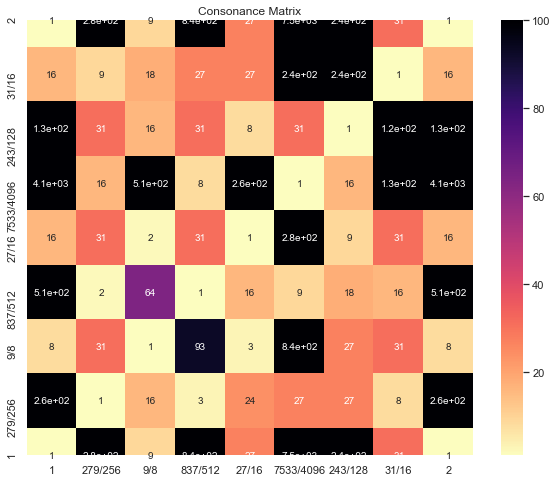

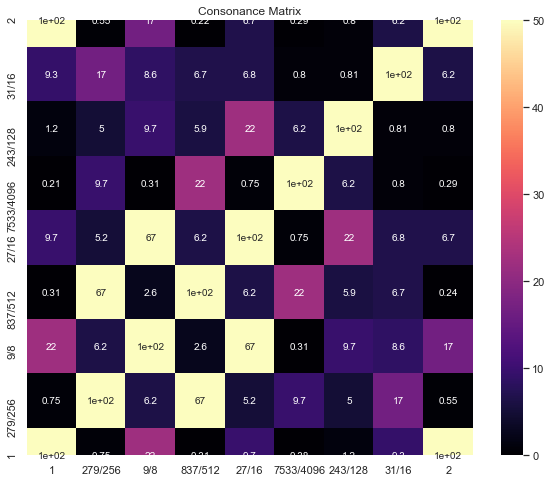

In [12]:

biotuning.peaks_extraction(epochs_data[40][10][4000:6000], FREQ_BANDS = FREQ_BANDS, ratios_extension = True, max_freq = 50)
scale = biotuning.euler_fokker_scale(biotuning.peaks, octave = 2)
cons_matrix = consonance_matrix(scale, vmin = 1, vmax = 100, cmap = 'magma_r', fig = None)
cons_matrix_harmsim = consonance_matrix(scale, metric_function = dyad_similarity, vmin = 0, vmax = 50, cmap = 'magma', fig = None)

## Exporting scale in scala format

In [13]:
create_SCL(biotuning.HE_scale, 'Harmonic_entropy_scale')
create_SCL(biotuning.diss_scale, 'Dissonance_curve_scale')
create_SCL(biotuning.peaks_ratios, 'Peaks_ratios_scale')
create_SCL(biotuning.extended_peaks_ratios_cons, 'consonant_extended_peaks_ratios_scale')


## Computing scale metrics 

#### From peaks ratios

In [14]:
metrics_peaks, _ = scale_to_metrics(biotuning.peaks_ratios)
metrics_peaks

{'sum_p_q': 1614,
 'sum_distinct_intervals': 58,
 'metric_3': 47.7488954933390,
 'sum_p_q_for_all_intervals': 234262,
 'sum_q_for_all_intervals': 116605,
 'harm_sim': 9.97,
 'matrix_harm_sim': 5.56845343125951,
 'matrix_cons': 0.05890015357123157}

#### From dissonance curve tuning

In [15]:
metrics_peaks, _ = scale_to_metrics(biotuning.diss_scale)
metrics_peaks

{'sum_p_q': 1463,
 'sum_distinct_intervals': 110,
 'metric_3': 22.7078366972617,
 'sum_p_q_for_all_intervals': 559837,
 'sum_q_for_all_intervals': 231738,
 'harm_sim': 17.88,
 'matrix_harm_sim': 2.2702028019816614,
 'matrix_cons': 0.024339402334298734}

## Spectromorphological computation

NAN []
2


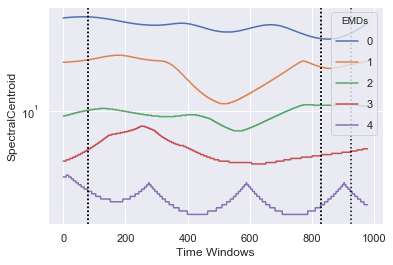

In [16]:
biotuning.compute_spectromorph(comp_chords = True, method = 'SpectralCentroid', min_notes = 4, cons_limit = 35, cons_chord_method = 'euler', 
                               window = 500, overlap = 1, graph = True)



In [17]:
biotuning.spectro_chords #correspond to moment in time when IMFs reach a level of consonance

[[2.5, 4.8, 10.0, 24.3, 52.5],
 [2.5, 4.9, 10.0, 24.3, 52.5],
 [1.8, 4.5, 11.0, 22.0, 36.0],
 [2.5, 4.8, 11.2, 22.4, 38.5]]

## Classical tuning creation from peaks and extended peaks

In [18]:
#Initiate object and extract peak information
biotuning_class_scales = biotuner(sf = 1000, peaks_function = 'EEMD', precision = 0.1, n_harm = 10,
                    ratios_n_harms = 5, ratios_inc_fit = True, ratios_inc = True) # Initialize biotuner object

biotuning_class_scales.peaks_extraction(data, FREQ_BANDS = FREQ_BANDS, ratios_extension = True, max_freq = 50)

### Euler-Fokker Genera using peaks as generators (using method)

In [19]:
biotuning_class_scales.euler_fokker_scale(biotuning.peaks)

[1, 279/256, 9/8, 837/512, 27/16, 7533/4096, 243/128, 31/16, 2]

### Euler-Fokker Genera using extended peaks as generators (using function)

In [20]:
biotuning_class_scales.peaks_extension(method = 'consonant_harmonic_fit', harm_function = 'div', div_mode = 'div_add', n_harm = 10, 
                          cons_limit = 0.3, ratios_extension = True)
euler_fokker_scale(biotuning_class_scales.extended_peaks)

[1,
 35/32,
 1125/1024,
 9/8,
 315/256,
 5/4,
 175/128,
 45/32,
 1575/1024,
 25/16,
 875/512,
 7/4,
 225/128,
 7875/4096,
 125/64,
 63/32,
 2]

In [21]:
biotuning_class_scales.peaks_extension(method = 'consonant_harmonic_fit', harm_function = 'mult', div_mode = 'div_add', n_harm = 5, 
                          cons_limit = 0.1, ratios_extension = True)
EFG_scale = biotuning_class_scales.euler_fokker_scale(biotuning_class_scales.extended_peaks)
scale_interval_names(EFG_scale, reduce = False)

[[1, 'Unison'],
 [1029/1024, None],
 [33/32, 'Thrty-third Harmonic'],
 [539/512, None],
 [147/128, None],
 [77/64, 'Seventy-seventh Harmonic'],
 [21/16, '21st Harmonic'],
 [343/256, None],
 [11/8, 'Eleventh Harmonic'],
 [11319/8192, None],
 [3/2, 'Perfect Fifth'],
 [49/32, 'Forty-ninth Harmonic'],
 [1617/1024, None],
 [7/4, 'Septimal Minor Seventh'],
 [231/128, None],
 [3773/2048, None],
 [2, 'Octave']]

### Harmonic scale using the positions of congruent harmonics

##### Using the harmonic positions derived from the peak extraction method 'harmonics peaks'

In [22]:
biotuning_harm_peaks = biotuner(sf = 1000, peaks_function = 'harmonic_peaks', precision = 0.1, n_harm = 10,
                    ratios_n_harms = 5, ratios_inc_fit = True, ratios_inc = True) # Initialize biotuner object

biotuning_harm_peaks.peaks_extraction(data, FREQ_BANDS = FREQ_BANDS, ratios_extension = True, max_freq = 50)

C:\Users\Dell\GitHub\biotuner\biotuner.py:1294: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  harmonics = np.array(harmonics)
C:\Users\Dell\GitHub\biotuner\biotuner.py:1295: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  harmonic_peaks = np.array(harmonic_peaks)


In [23]:
harm_tuning = harmonic_tuning(biotuning_harm_peaks.all_harmonics)
harm_tuning

[1.03125,
 1.046875,
 1.125,
 1.15625,
 1.203125,
 1.25,
 1.28125,
 1.296875,
 1.3125,
 1.359375,
 1.375,
 1.46875,
 1.5,
 1.53125,
 1.609375,
 1.640625,
 1.6875,
 1.75,
 1.875,
 2.0]

In [24]:
metrics, _ = scale_to_metrics(harm_tuning)
metrics

{'sum_p_q': 1440,
 'sum_distinct_intervals': 318,
 'metric_3': 106.378085682944,
 'sum_p_q_for_all_intervals': 39764,
 'sum_q_for_all_intervals': 16385,
 'harm_sim': 18.39,
 'matrix_harm_sim': 9.242628960629903,
 'matrix_cons': 0.09961674159569489}

##### Using the harmonic position of the congruent harmonics of peaks

In [25]:
harm_tuning2 = biotuning.harmonic_fit_tuning(n_harm =128, bounds = 0.1, n_common_harms = 10)
harm_tuning2


[1.25, 1.3125, 1.5, 1.640625, 1.875, 1.96875]

In [26]:
metrics, _ = scale_to_metrics(harm_tuning2)
metrics

{'sum_p_q': 338,
 'sum_distinct_intervals': 18,
 'metric_3': 12.9360908171294,
 'sum_p_q_for_all_intervals': 610,
 'sum_q_for_all_intervals': 293,
 'harm_sim': 23.81,
 'matrix_harm_sim': 26.884920634920636,
 'matrix_cons': 0.3063161375661375}

##### Scale from generator interval

In [27]:
data = epochs_data[9][31][2000:4000] # Define data (single time series)


#biotuning = biotuner(sf = 1000, peaks_function = 'EEMD', precision = 0.1, n_harm = 10,
#                    ratios_n_harms = 5, ratios_inc_fit = True, ratios_inc = True) # Initialize biotuner object

biotuning.peaks_extraction(data, FREQ_BANDS = FREQ_BANDS, ratios_extension = True, max_freq = 50)

ratios, cons = consonant_ratios(biotuning.peaks, limit = 0.01, input_type = 'peaks', metric = 'harmsim') #finding the intervals
ratio_arg = np.argmax(cons)
cons_ratio = ratios[ratio_arg]

In [28]:
gen_interval_tuning = pytuning.scales.create_equal_interval_scale(ratios[0], scale_size = 11, number_down_intervals = 6, octave = 2)
gen_interval_tuning = [float(x) for x in gen_interval_tuning]

frac, _, _ = scale2frac(gen_interval_tuning, 64) # Transform the ratios into fractions with controlled maximum denominator.
                                                 # Using smaller denominator limit will maximize the chance to find intervalic names in the dictionary
frac2, _, _ = scale2frac(gen_interval_tuning, 16)

print(scale_interval_names(frac, reduce = False),'\n\n', scale_interval_names(frac2, reduce = False))

[[1, 'Unison'], [63/61, None], [16/15, 'Just Minor Second'], [43/39, None], [41/36, None], [79/48, None], [17/10, None], [72/41, None], [78/43, None], [15/8, 'Just Major Seventh'], [91/47, None], [2, 'Octave']] 

 [[1, 'Unison'], [17/16, 'Minor Diatonic Semitone'], [16/15, 'Just Minor Second'], [11/10, "Ptolemy's second"], [8/7, 'Septimal Major Second'], [23/14, None], [17/10, None], [7/4, 'Septimal Minor Seventh'], [29/16, 'Twenty-ninth Harmonic'], [15/8, 'Just Major Seventh'], [31/16, 'Thirty-first Harmonic'], [2, 'Octave']]


In [29]:
gen_interval_tuning = [np.round(float(t), 3) for t in gen_interval_tuning]
metrics, _ = scale_to_metrics(gen_interval_tuning)
metrics

{'sum_p_q': 12545,
 'sum_distinct_intervals': 110,
 'metric_3': 70.9669220343272,
 'sum_p_q_for_all_intervals': 206924,
 'sum_q_for_all_intervals': 84781,
 'harm_sim': 18.25,
 'matrix_harm_sim': 2.2427372537368826,
 'matrix_cons': 0.030143081305390246}

##### Scale reduction based on harmonicity between ratios

In [30]:
scale_metric, reducted_scale, mode_metric = scale_reduction(biotuning.peaks_ratios, mode_n_steps = 7, function = dyad_similarity)
scale_metric, np.sort(reducted_scale), mode_metric

(1.9843695431750996,
 array([1.0326087 , 1.28378378, 1.33695652, 1.4375    , 1.484375  ,
        1.66216216, 1.921875  ]),
 2.6893194079215554)

In [31]:
scale_metric, reducted_scale, mode_metric = scale_reduction(biotuning.peaks_ratios, mode_n_steps = 7, function = metric_denom)
scale_metric, np.sort(reducted_scale), mode_metric

(1706.8666666666666,
 array([1.0326087 , 1.24324324, 1.28378378, 1.33695652, 1.4375    ,
        1.484375  , 1.921875  ]),
 1274.4761904761904)

## Visualizing ratios with Lissajous curves

#### thanks to https://glowingpython.blogspot.com/2011/12/lissajous-curves.html

In [32]:
tuning = biotuning.harmonic_fit_tuning()
tuning = biotuning.peaks_ratios
fracs, num, denom = scale2frac(tuning)

[95/92, 37/32, 46/37, 95/74, 123/95, 123/92, 23/16, 95/64, 123/74, 123/64]


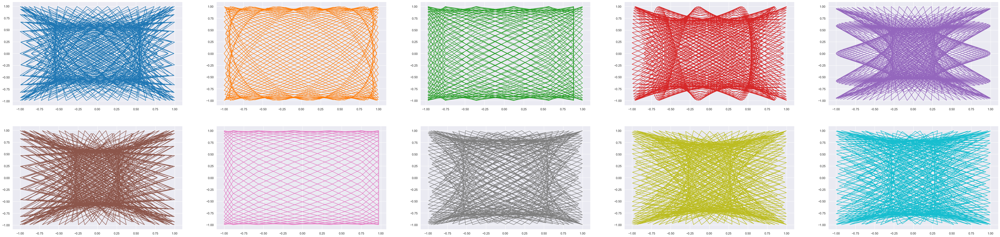

In [33]:
from numpy import sin,pi,linspace
from pylab import plot,show,subplot
from matplotlib.pyplot import figure
import matplotlib.colors as mcolors
figure(figsize=(64, 40), dpi=80)
a = num # plotting the curves for
b = denom # different values of a/b
delta = pi/2
t = linspace(-pi,pi,300)
colors = list(mcolors.TABLEAU_COLORS.values())*3
#colors = list(mcolors.CSS4_COLORS.values())
#colors = sbn.color_palette("rocket")
for i, c in zip(range(len(a)), colors):
    x = sin(a[i] * t + delta)
    y = sin(b[i] * t)
    if len(a) % 2 == 0:
        subplot(int(len(a)/2),int(len(a)/2),i+1)
    else:
        subplot(int(len(a)/2),int(len(a)/2)+1,i+1)
    plot(x,y, c)

#show()
print(fracs)

[1, 1033/1000, 1067/1000, 551/500, 1139/1000, 823/500, 17/10, 439/250, 907/500, 937/500, 242/125, 2]


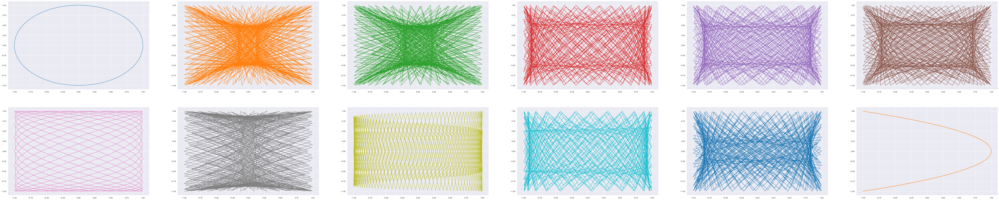

In [34]:
fracs2, num2, denom2 = scale2frac(gen_interval_tuning)
figure(figsize=(100, 64), dpi=90)
a = num2 # plotting the curves for
b = denom2 # different values of a/b
delta = pi/2
t = linspace(-pi,pi,300)
colors = list(mcolors.TABLEAU_COLORS.values())*3
for i, c in zip(range(len(a)), colors):
    x = sin(a[i] * t + delta)
    y = sin(b[i] * t)
    if len(a) % 2 == 0:
        subplot(int(len(a)/2),int(len(a)/2),i+1)
    else:
        subplot(int(len(a)/2),int(len(a)/2)+1,i+1)
    plot(x,y, c)

#show()
print(fracs2)

##### Congruent N-TET derived from multiple ratios

## Constructing euclidian rhythms from biotunings

Euclidian rhythms represent an even distribution of pulses within a specified number of steps. It is possible to convert frequency ratios into euclidian rhythms in that a ratio's numerator can be seen as the number of pulses and a ratio's denominator as the number of steps within which the pulses should be distributed. 

In [35]:
cons_harm_tuning = sort_scale_by_consonance(harm_tuning) # sorting a tuning by consonance of intervals
cons_harm_tuning

[2.0,
 1.5,
 1.25,
 1.75,
 1.125,
 1.375,
 1.875,
 1.3125,
 1.6875,
 1.03125,
 1.15625,
 1.28125,
 1.46875,
 1.53125,
 1.046875,
 1.203125,
 1.296875,
 1.359375,
 1.609375,
 1.640625]

'scale2euclid' function derives euclidian rhythms from a series of ratios.

When mode = 'normal', the ratios are inverted and the numerator is taken as the number of pulses and the denominator as the number of steps (e.g. 3/2 -> 2pulses/3steps).

When mode = 'full', the ratios are inverted. The number of steps corresponds to num*denom and the numbers of pulses correspond to both the initial numerator and denominator (e.g. 3/2 -> 3pulses/6steps and 2pulses/6steps)

In [36]:
euclid_patterns = scale2euclid(cons_harm_tuning[2:8], min_denom = 16, mode = 'normal')
harm_tuning_frac, _, _ = scale2frac(cons_harm_tuning[2:8])
interval_vectors = [interval_vector(x) for x in euclid_patterns]
harm_tuning_frac, euclid_patterns, interval_vectors

([5/4, 7/4, 9/8, 11/8, 15/8, 21/16],
 [[1, 0, 0, 0],
  [1, 1, 1, 0],
  [1, 0, 0, 0, 0, 0, 0, 0],
  [1, 0, 0, 1, 0, 0, 1, 0],
  [1, 1, 1, 1, 1, 1, 1, 0],
  [1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]],
 [[4], [1, 1, 2], [8], [3, 3, 2], [1, 1, 1, 1, 1, 1, 2], [3, 3, 3, 3, 4]])

'consonant_euclid' function derives euclidian rhythm from a set of consonant intervals. 

First, a set of denominators is defined by finding the common denominator of each pair of ratios (e.g. 3/5 and 4/7 give 5*7=35). 

The consonance is computed on each pairs of denominators to find harmonic subdivisions. Only the euclidian rhythms from consonant denominators (steps) are returned.

In [37]:
euclid_final, cons = consonant_euclid(harm_tuning2, n_steps_down = 2, limit_denom = 8, 
                                      limit_cons = 0.1, limit_denom_final = 16)
interval_vectors = [interval_vector(x) for x in euclid_final]
strings = interval_vec_to_string(interval_vectors)
euclid_referent = euclid_string_to_referent(strings, dict_rhythms)
euclid_final, interval_vectors, euclid_referent

C:\Users\Dell\Anaconda3\lib\fractions.py:601: RuntimeWarning: overflow encountered in longlong_scalars
  self._denominator * other.numerator)


([[1, 0, 0, 1, 0, 0, 0],
  [1, 0, 0, 1, 0, 0, 1, 0],
  [1, 0, 1, 0, 1, 0, 0],
  [1, 0, 1, 0, 1, 0, 1],
  [1, 0, 1, 1, 0, 1, 1, 0]],
 [[3, 4], [3, 3, 2], [2, 2, 3], [2, 2, 2, 1], [2, 1, 2, 1, 2]],
 ['None',
  "It is none other than one of the most famous rythms on the planet. In Cuba it goes by the name of the tresillo and in the USA is often called the Habanera rhythm used in hundreds of rockabilly songs during the 1950s. It can often be heard in early rock-and-roll hits in the left-hand patterns of the piano, or played on the string bass or saxophone. A good example is the bass rhythm in Elvis Presley's Hound Dog. The tresillo pattern is also found widely in West African traditional music. For example, it is played on the atoke bell in the Sohu, an Ewe dance from Ghana. The tresillo can also be recognized as the first bar of the ubiquitous two-bar clave Son given by [1001001000101000].",
  "It is the Ruchenitza rhythm used in a Bulgarian folk-dance. It is also the metric pattern of Pi

In [38]:
interval_vector(bjorklund(16, 13))

[1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1]

### Derive chords from instantaneous frequencies of intrinsic mode functions

In [39]:
biotuning_IF = biotuner(sf = 1000, precision = 0.1, n_harm = 10,
                    ratios_n_harms = 5, ratios_inc_fit = True, ratios_inc = True) # Initialize biotuner object

biotuning_IF.peaks_extraction(data, FREQ_BANDS = FREQ_BANDS,peaks_function = 'HH1D_max',  ratios_extension = True, max_freq = 50)
biotuning_IF.compute_peaks_metrics()

In [40]:
chords, positions = timepoint_consonance (biotuning_IF.IF, method = 'cons', limit = 0.1, min_notes = 3)
chords

NAN []


C:\Users\Dell\Anaconda3\lib\site-packages\numpy\lib\function_base.py:380: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
C:\Users\Dell\Anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[[8.21, 1.22, 5.35, 22.4],
 [56.6, 18.87, 4.22],
 [8.3, 1.5, 159.82],
 [1.64, 4.11, 39.42],
 [24.9, 1.77, 4.26],
 [4.83, 21.92, 6.51],
 [1.98, 10.3, 1.27, 6.58],
 [0.89, 4.34, 7.35],
 [0.77, 8.42, 66.85, 18.71],
 [27.05, 12.29, 4.3, 86.04],
 [8.73, 25.41, 3.53],
 [0.34, 9.12, 90.81]]

In [41]:
chords_ratios, chords_bounded = chords_to_ratios(chords, harm_limit = 2, spread = False)
chords_ratios

[[12, 13, 14, 21],
 [42, 47, 71],
 [15, 21, 25],
 [16, 21, 25],
 [18, 21, 31],
 [48, 55, 65],
 [13, 13, 16, 20],
 [9, 9, 11],
 [8, 10, 11, 12],
 [43, 54, 61, 68],
 [35, 44, 64],
 [3, 4, 6]]

In [42]:
chords_ratios2, chords_bounded2 = chords_to_ratios(chords, harm_limit = 2, spread = True)
chords_ratios2

[[12, 13, 21, 28],
 [42, 47, 71],
 [15, 21, 25],
 [16, 21, 25],
 [18, 21, 31],
 [48, 65, 110],
 [13, 20, 33, 52],
 [9, 11, 18],
 [8, 11, 12, 21],
 [43, 61, 68, 108],
 [35, 44, 64],
 [3, 6, 7]]

### Listening to scales and chords

In [43]:
listen_scale(biotuning.diss_scale, 250, 500)

Scale: [1.196969696969697, 1.2708333333333333, 1.3888888888888888, 1.5, 1.5180722891566265, 1.58, 1.6881720430107527, 1.8979591836734695, 1.922077922077922, 1.9420289855072463, 2.0]
250
299.24242424242425
317.7083333333333
347.22222222222223
375.0
379.51807228915663
395.0
422.0430107526882
474.48979591836735
480.5194805194805
485.50724637681157
500.0


In [54]:
listen_chords(chords_bounded, 400, 500)

Chords: [[1.0, 1.0833333333333333, 1.1666666666666667, 1.75], [1.0, 1.119047619047619, 1.6904761904761905], [1.0, 1.4, 1.6666666666666667], [1.0, 1.3125, 1.5625], [1.0, 1.1666666666666667, 1.7222222222222223], [1.0, 1.1458333333333333, 1.3541666666666667], [1.0, 1.0, 1.2307692307692308, 1.5384615384615385], [1.0, 1.0, 1.2222222222222223], [1.0, 1.25, 1.375, 1.5], [1.0, 1.255813953488372, 1.4186046511627908, 1.5813953488372092], [1.0, 1.2571428571428571, 1.8285714285714285], [1.0, 1.3333333333333333, 2.0]]


### MOS scales

In [57]:
mediant, mediant_frac, gen_interval, gen_interval_frac, MOS_signature, invert_MOS_signature = tuning_range_to_MOS(1/2, 4/5)
MOS_signature

1 2 4 5


[5, 2]